In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from MTGA.MTGA import *

from MTGA.MTGAInstance import Instance
import MTGA.Generators as Generators
import MTGA.Mutators as Mutators
import MTGA.WeightGenerators as WeightGenerators
import Fixers as Fixers
import Evaluators as Evaluators

from MTGA.GeneVisualizer import GeneEvolutionRenderer
from Displayer import Displayer

from Utils import *


## Main Instance

In [3]:
instance = Instance("problems/p1.json",
    evaluator=Evaluators.CummulativeEvaluator(),
    mutator=Mutators.WalkMutator(),
    generator=Generators.Generator(),
    fixer=Fixers.ChoiceFixer(),
    weight_generator=WeightGenerators.SoftmaxWeights())

In [11]:
print("problem size", instance.size)
print("fire starts", instance.fire_starts)
print("num teams", instance.problem.num_teams)

problem size 10


AttributeError: 'Instance' object has no attribute 'fire_starts'

In [4]:
displayer = Displayer()
gene_displayer = GeneEvolutionRenderer()

## The Run

In [5]:
data = optimize_and_collect(instance)

[2025-02-03 11:36:59][  0]     0.03876090     0.03875923 {  1.00000000   4.60600000  50.00000000   5.84044211}
[2025-02-03 11:36:59][  1]     0.07361460     0.03316784 {  1.00000000   5.92400000  50.00000000   7.34807621}
[2025-02-03 11:36:59][  2]     0.11773944     0.04054141 {  1.00000000   5.60400000  50.00000000   6.52343345}
[2025-02-03 11:36:59][  3]     0.14950824     0.02976251 {  1.00000000   5.00600000  50.00000000   5.93784170}
[2025-02-03 11:36:59][  4]     0.18438768     0.03399324 {  1.00000000   4.90200000  50.00000000   5.32732541}
[2025-02-03 11:36:59][  5]     0.21763563     0.03237748 {  1.00000000   4.80600000  50.00000000   5.58966582}
[2025-02-03 11:36:59][  6]     0.24777174     0.02918363 {  1.00000000   4.97000000  50.00000000   5.00050997}
[2025-02-03 11:36:59][  7]     0.28930879     0.04029465 {  1.00000000   5.08000000  50.00000000   5.81563410}
[2025-02-03 11:36:59][  8]     0.32345200     0.03297043 {  1.00000000   4.47000000  50.00000000   4.33832917}
[

In [6]:
evaluator = Evaluators.MainEvaluator()
solutions = [ (np.where(bool_array)[0].tolist(), evaluator(instance.problem, bool_array)) for bool_array, _ in instance.solutions ]

## Results

In [7]:
best_solution, best_solutions_value = max(solutions, key=lambda x: x[1])
print(f"Best solution [{best_solutions_value}]:\n{best_solution}")

Best solution [5]:
[1, 3, 6, 9]


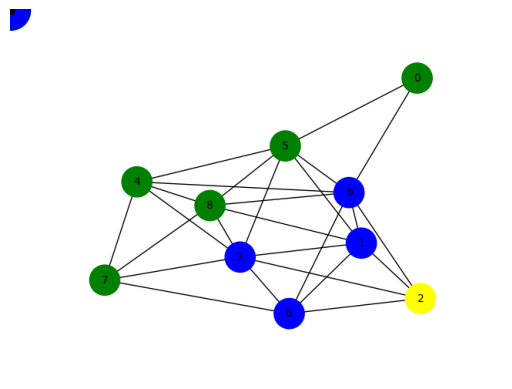

In [8]:
instance.problem.visualize_fire(displayer, best_solution)

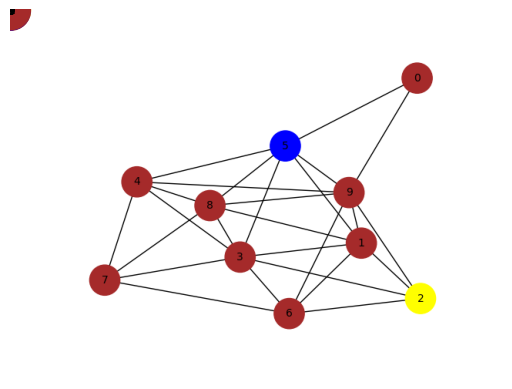

In [9]:
instance.problem.visualize_fires(displayer, solutions)

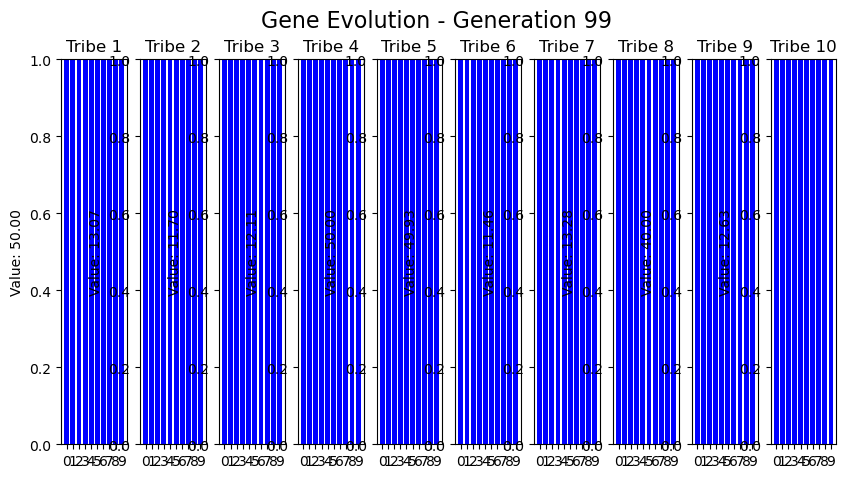

In [10]:
gene_displayer.visualize(data)